In [1]:
import json
import pandas as pd
from pathlib import Path

with open("../Sample_Data/labeled_trackings_from_api.json") as f:
    data = json.load(f)

print(f"Loaded {len(data)} trackings.")


Loaded 8 trackings.


In [2]:
rows = []
for t in data:
    for point in t["points"]:
        row = {
            "tracking_id": t["id"],
            "name": t["name"],
            "label": t.get("label"),
            "duration": t["duration"],
            "length": t["length"],
            "latitude": point["latitude"],
            "longitude": point["longitude"],
            "sequence": point["sequence"],
            "speed": point["speed"],
            "time": point["time"],
        }
        rows.append(row)

df = pd.DataFrame(rows)
df["time"] = pd.to_datetime(df["time"])
df.head()


,tracking_id,name,label,duration,length,latitude,longitude,sequence,speed,time
0,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.282006,14.304086,0,0.0,2025-02-28 06:13:44+01:00
1,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.280932,14.301821,1,0.0,2025-02-28 06:13:56+01:00
2,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.280776,14.301146,2,0.0,2025-02-28 06:14:01+01:00
3,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.280854,14.301254,3,0.0,2025-02-28 06:14:08+01:00
4,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.281212,14.302188,4,0.0,2025-02-28 06:14:18+01:00


In [ ]:
import folium

m = folium.Map(location=[48.2, 14.3], zoom_start=12)

for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row["latitude"], row["longitude"]),
        radius=2,
        color="blue" if row["label"] == "RURAL" else "green",
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m


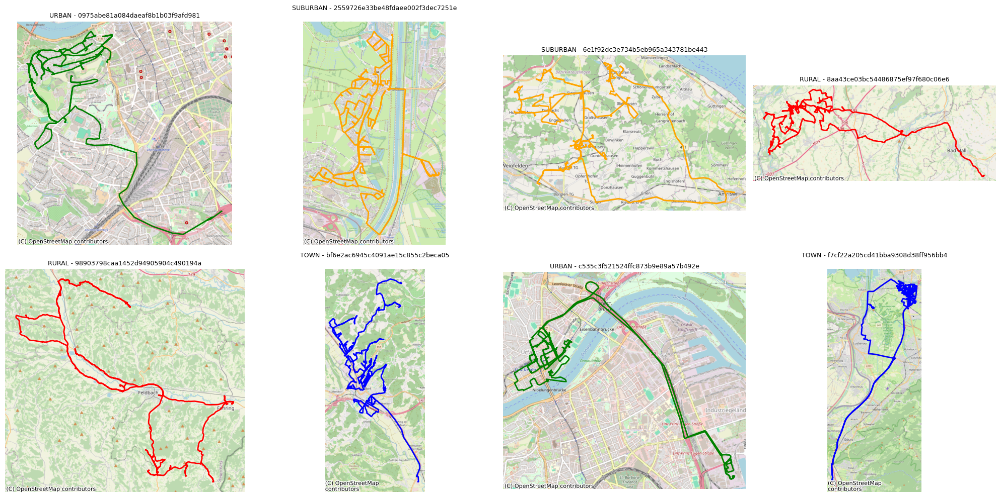

In [7]:
import json
from pathlib import Path
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from shapely.geometry import LineString

data_path = Path("../Sample_Data/labeled_trackings_from_api.json")
with open(data_path, "r", encoding="utf-8") as f:
    trackings = json.load(f)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

color_map = {
    "RURAL": "red",
    "SUBURBAN": "orange",
    "TOWN": "blue",
    "URBAN": "green"
}

for i, tracking in enumerate(trackings):
    ax = axes[i]
    points = tracking.get("points", [])
    if not points:
        continue

    coords = [(p["longitude"], p["latitude"]) for p in points]
    line = LineString(coords)

    gdf = gpd.GeoDataFrame(index=[0], geometry=[line], crs="EPSG:4326")
    gdf = gdf.to_crs(epsg=3857)  

    gdf.plot(ax=ax, color=color_map.get(tracking["label"], "gray"), linewidth=2)
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    ax.set_title(f'{tracking["label"]} - {tracking["name"]}', fontsize=9)
    ax.set_axis_off()

for j in range(len(trackings), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("../../../../Thesis/Text/Figures/sample_tracking_routes_mapgrid.png", dpi=300)
plt.show()


In [4]:
from geopy.distance import geodesic

def extract_features(tracking):
    points = tracking["points"]
    if len(points) < 2:
        return None
    
    coords = [(p["latitude"], p["longitude"]) for p in points]
    
    dists = [
        geodesic(coords[i], coords[i+1]).meters
        for i in range(len(coords) - 1)
    ]
    total_dist = sum(dists)

    lats = [p["latitude"] for p in points]
    lons = [p["longitude"] for p in points]
    lat_span = max(lats) - min(lats)
    lon_span = max(lons) - min(lons)

    return {
        "tracking_id": tracking["id"],
        "label": tracking.get("label"),
        "length": tracking["length"],
        "duration": tracking["duration"] / 1e9,  
        "num_points": len(points),
        "bbox_area": lat_span * lon_span,
        "point_density": len(points) / (lat_span * lon_span + 1e-6),
        "avg_segment_distance": total_dist / len(dists),
        "num_stops": sum(1 for p in points if p["speed"] == 0)
    }

features = [extract_features(t) for t in data]
features = [f for f in features if f]  
features_df = pd.DataFrame(features)
features_df.head()


,tracking_id,label,length,duration,num_points,bbox_area,point_density,avg_segment_distance,num_stops
0,99476,URBAN,21.069127,154.46,782,0.000971,804692.673498,26.377508,782
1,99713,SUBURBAN,43.080974,274.96,734,0.001321,555181.643849,57.350688,734
2,99307,SUBURBAN,113.679932,250.73,1496,0.016359,91440.502533,75.228013,1496
3,100913,RURAL,134.669804,385.71,1934,0.029868,64749.352379,69.108692,1934
4,99944,RURAL,227.180098,863.48,3033,0.074858,40515.906612,72.715480,3033


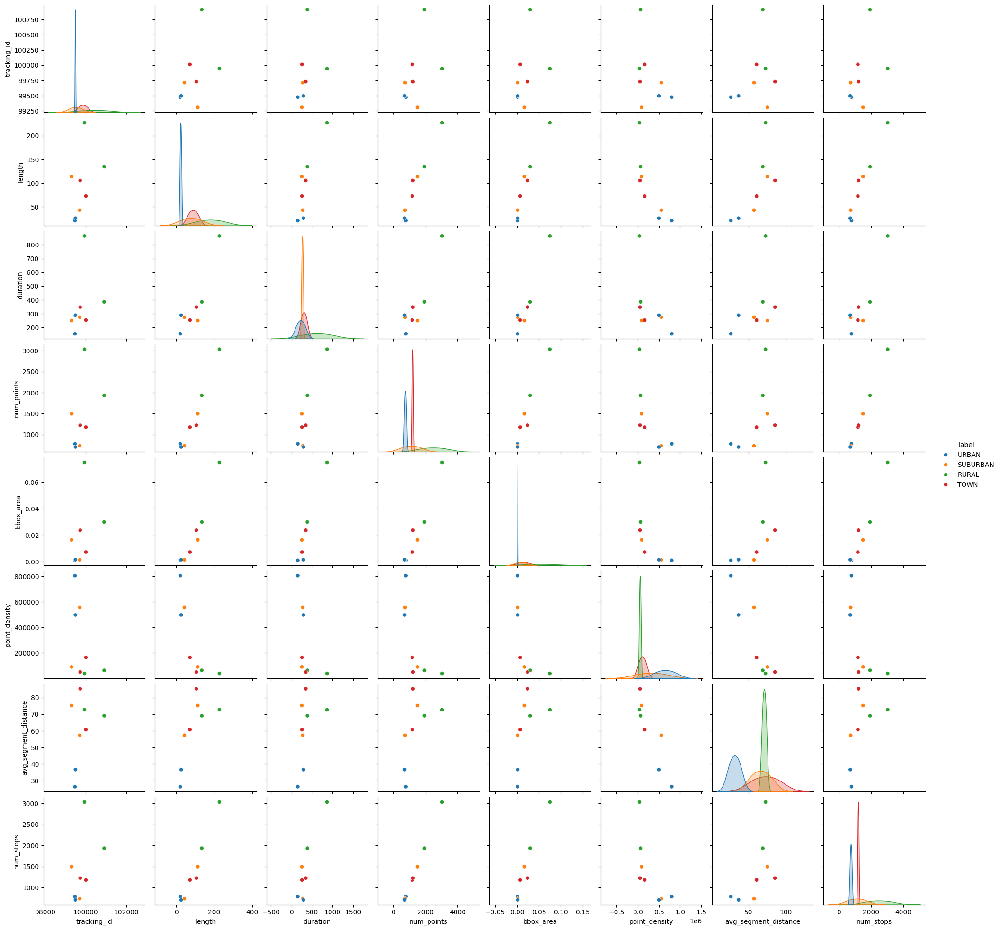

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(features_df, hue="label")

plt.savefig("../../../../Thesis/Text/Figures/sample_pairplot.png", dpi=300, bbox_inches="tight")


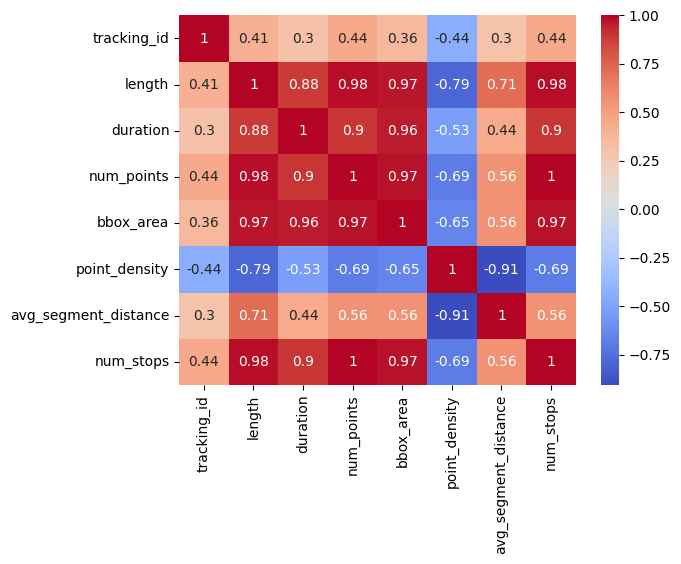

In [15]:
sns.heatmap(features_df.drop(columns="label").corr(), annot=True, cmap="coolwarm")
plt.savefig("../../../../Thesis/Text/Figures/sample_correlation_matrix.png", dpi=300, bbox_inches="tight")


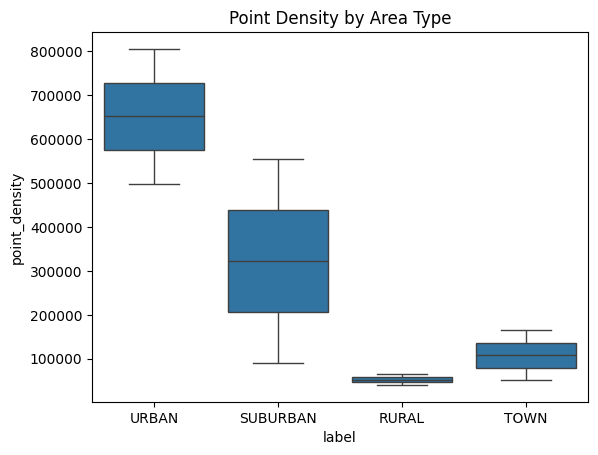

In [14]:
sns.boxplot(data=features_df, x="label", y="point_density")
plt.title("Point Density by Area Type")
plt.savefig("../../../../Thesis/Text/Figures/sample_point_density_boxplot.png", dpi=300, bbox_inches="tight")